# Self-Attention，Cross-Attentionが2層ずつ

In [2]:
import os
import json
import numpy as np
import shutil
import matplotlib.pyplot as plt
from PIL import Image
from tqdm import tqdm
from tokenizers import Tokenizer
from transformers import ViTFeatureExtractor, ViTModel, PreTrainedModel, PretrainedConfig

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch import optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms

2025-04-29 09:15:13.373091: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-04-29 09:15:13.501624: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-04-29 09:15:13.541353: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-04-29 09:15:13.819422: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-04-29 09:15:14.986291: W tensorflow/compiler/tf2

In [3]:
NO_WORD_IMAGE_ONLY = True
REAL_IMAGE_ONLY = True
REAL_IMAGE_THRESHOLD = 0.75
NO_UNIQUE_NOUN_SENTENCE_ONLY = True

MAX_SENTENCE_LENGTH = 31
MIN_SENTENCE_LENGTH = 4
MIN_FREQUENCY = 16

LERNING_RATE = 0.0001
BATCH_SIZE = 32
EPOCHS = 25
HIDDEN_DIM = 1024 # 512

result_dir = f"../results/GUMI_T2/{NO_WORD_IMAGE_ONLY}_{REAL_IMAGE_ONLY}_{REAL_IMAGE_THRESHOLD}_{NO_UNIQUE_NOUN_SENTENCE_ONLY}_{MAX_SENTENCE_LENGTH}_{MIN_SENTENCE_LENGTH}_{MIN_FREQUENCY}_{LERNING_RATE}_{BATCH_SIZE}_{EPOCHS}_{HIDDEN_DIM}/"
if os.path.exists(result_dir):
    shutil.rmtree(result_dir)
os.makedirs(result_dir, exist_ok= True)
with open(f"{result_dir}training_config.json", "w") as f:
    json.dump({
        "NO_WORD_IMAGE_ONLY": NO_WORD_IMAGE_ONLY,
        "REAL_IMAGE_ONLY": REAL_IMAGE_ONLY,
        "REAL_IMAGE_THRESHOLD": REAL_IMAGE_THRESHOLD,
        "NO_UNIQUE_NOUN_SENTENCE_ONLY": NO_UNIQUE_NOUN_SENTENCE_ONLY,

        "MAX_SENTENCE_LENGTH": MAX_SENTENCE_LENGTH,
        "MIN_SENTENCE_LENGTH": MIN_SENTENCE_LENGTH,
        "MIN_FREQUENCY": MIN_FREQUENCY,

        "LERNING_RATE": LERNING_RATE,
        "BATCH_SIZE": BATCH_SIZE,
        "EPOCHS": EPOCHS,
        "HIDDEN_DIM": HIDDEN_DIM
    }, f)

IMAGE_FEATURE_DIR = "../datas/image_features/ViT/"
os.makedirs(IMAGE_FEATURE_DIR, exist_ok = True)

In [4]:
IMAGE_DIR = "../datas/Bokete_Dataset/boke_image/"
data_dir = f"../datas/{NO_WORD_IMAGE_ONLY}_{REAL_IMAGE_ONLY}_{REAL_IMAGE_THRESHOLD}_{NO_UNIQUE_NOUN_SENTENCE_ONLY}_{MAX_SENTENCE_LENGTH}_{MIN_SENTENCE_LENGTH}_{MIN_FREQUENCY}/"

train_inputs_1 = np.load(f"{data_dir}train_inputs_1.npy")
train_inputs_2 = np.load(f"{data_dir}train_inputs_2.npy")
train_teacher_signals = np.load(f"{data_dir}train_teacher_signals.npy")
test_inputs_1 = np.load(f"{data_dir}test_inputs_1.npy")
test_inputs_2 = np.load(f"{data_dir}test_inputs_2.npy")
test_teacher_signals = np.load(f"{data_dir}test_teacher_signals.npy")
tokenizer = Tokenizer.from_file(f"{data_dir}tokenizer.json")
VOCAB_SIZE = tokenizer.get_vocab_size()

#
train_inputs_1.shape, train_inputs_2.shape, train_teacher_signals.shape, test_inputs_1.shape, test_inputs_2.shape, test_teacher_signals.shape, VOCAB_SIZE

((1363946,),
 (1363946, 32),
 (1363946, 32),
 (14118,),
 (14118, 32),
 (14118, 32),
 17363)

In [4]:
image_numbers = set(train_inputs_1.tolist() + test_inputs_1.tolist())
tmp_image_numbers = list()
for IN in image_numbers:
    if os.path.exists(f"{IMAGE_FEATURE_DIR}{IN}.npy"):
        continue
    tmp_image_numbers.append(IN)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_name = "google/vit-base-patch16-224-in21k"
image_feature_extractor = ViTFeatureExtractor.from_pretrained(model_name) 
vit = ViTModel.from_pretrained(model_name)
vit = vit.to(device)
vit.eval()

bs = 512
for idx in tqdm(range(0, len(tmp_image_numbers), bs)):
    images = [Image.open(f"{IMAGE_DIR}{IN}.jpg").convert("RGB") for IN in tmp_image_numbers[idx:idx + bs]]
    images = image_feature_extractor(images, return_tensors="pt").to(device)
    
    with torch.no_grad():
        outputs = vit(**images)
    image_features = outputs.last_hidden_state[:, 1:, :].cpu().numpy()

    for i, IN in enumerate(tmp_image_numbers[idx:idx + bs]):
        np.save(f"{IMAGE_FEATURE_DIR}{IN}.npy", image_features[i])

/home/user/Colab_20250113/lib/python3.11/site-packages/transformers/models/vit/feature_extraction_vit.py:28: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(
100%|██████████| 430/430 [32:13<00:00,  4.50s/it]


In [5]:
def make_image_dataloader(inputs_1, inputs_2, test_teacher_signals):
    class LoadImageDataset(Dataset):
        def __init__(self, inputs_1, inputs_2, test_teacher_signals):
            """
                inputs_1: 画像の番号からなるリスト
                inputs_2: 入力文からなるリスト
                test_teacher_signals: 教師信号からなるリスト
            """
            if len(inputs_1) != len(inputs_2):
                raise ValueError("inputs_1 and inputs_2 must have the same length.")
            if len(inputs_1) != len(test_teacher_signals):
                raise ValueError("inputs_1 and test_teacher_signals must have the same length.")

            self.inputs_1 = inputs_1
            self.inputs_2 = inputs_2
            self.test_teacher_signals = test_teacher_signals

        def __len__(self):
            return len(self.inputs_1)

        def __getitem__(self, idx):
            image_feature = torch.Tensor( np.load(f"{IMAGE_FEATURE_DIR}{self.inputs_1[idx]}.npy") ).to(torch.float32)
            input_sentence = torch.Tensor( self.inputs_2[idx] ).to(torch.int64)
            teacher_signal = torch.Tensor( self.test_teacher_signals[idx] ).to(torch.int64)
            
            return image_feature, input_sentence, teacher_signal

    dataset = LoadImageDataset(inputs_1, inputs_2, test_teacher_signals)
    dataloader = DataLoader(
        dataset, 
        batch_size = BATCH_SIZE, 
        num_workers = int(os.cpu_count() * 0.6), 
        shuffle = True
    )

    return dataloader

train_dataloader = make_image_dataloader(train_inputs_1, train_inputs_2, train_teacher_signals)
test_dataloader = make_image_dataloader(test_inputs_1, test_inputs_2, test_teacher_signals)

#
i1, i2, t = next(iter(train_dataloader))
i1.shape, i2.shape, t.shape

(torch.Size([32, 196, 768]), torch.Size([32, 32]), torch.Size([32, 32]))

In [6]:
class SelfAttentionBlock(nn.Module):
    def __init__(self, hidden_dim, input_length):
        super(SelfAttentionBlock, self).__init__()
        self.hidden_dim = hidden_dim
        self.input_length = input_length

        self.layer_norm_1 = nn.LayerNorm(hidden_dim)
        self.self_attention = nn.MultiheadAttention(
            embed_dim = hidden_dim, 
            num_heads = 8, 
            batch_first = True
        )

        self.layer_norm_2 = nn.LayerNorm(hidden_dim)
        self.fc_1 = nn.Linear(hidden_dim, hidden_dim)
        self.fc_2 = nn.Linear(hidden_dim, hidden_dim)
    
    def forward(self, x):

        batch_size, _, _ = x.size()
        attn_mask = torch.triu(torch.ones(self.input_length, self.input_length), diagonal = 1).bool()
        attn_mask = attn_mask.to(x.device)

        z = self.layer_norm_1(x)
        z, attn_output_weights  = self.self_attention(z, z, z, attn_mask = attn_mask)
        z = x + z

        y = self.layer_norm_2(z)
        y = nn.LeakyReLU()( self.fc_1(y) )
        y = self.fc_2(y)
        y = y + z

        return y, attn_output_weights

class CrossAttentionBlock(nn.Module):
    def __init__(self, hidden_dim):
        super(CrossAttentionBlock, self).__init__()
        self.hidden_dim = hidden_dim

        self.layer_norm_1 = nn.LayerNorm(hidden_dim)
        self.cross_attention = nn.MultiheadAttention(
            embed_dim = hidden_dim,
            num_heads = 8,
            batch_first = True
        )

        self.layer_norm_2 = nn.LayerNorm(hidden_dim)
        self.fc_1 = nn.Linear(hidden_dim, hidden_dim)
        self.fc_2 = nn.Linear(hidden_dim, hidden_dim)
        self.activation = nn.LeakyReLU()

    def forward(self, x, y):
        """
        x: Decoder側の入力 (batch_size, seq_len, hidden_dim)
        y: Encoder側の出力 (batch_size, num_patch, hidden_dim)
        """

        z = self.layer_norm_1(x)
        z, attn_output_weights = self.cross_attention(
            query = z,
            key = y,
            value = y
        )
        z = x + z

        y = self.layer_norm_2(z)
        y = self.activation(self.fc_1(y))
        y = self.fc_2(y)
        y = y + z

        return y, attn_output_weights

class SentenceGenerator(nn.Module):
    def __init__(self, vocab_size, input_length, hidden_dim, patch_dim, ):
        super(SentenceGenerator, self).__init__()

        self.embedding = nn.Embedding(vocab_size, hidden_dim)
        self.fc_1 = nn.Linear(patch_dim, hidden_dim)
        self.sa_1 = SelfAttentionBlock(hidden_dim, input_length)
        self.ca_1 = CrossAttentionBlock(hidden_dim)
        self.sa_2 = SelfAttentionBlock(hidden_dim, input_length)
        self.ca_2 = CrossAttentionBlock(hidden_dim)
        self.fc_2 = nn.Linear(hidden_dim, vocab_size)

    def forward(self, x, y):
        """
            x: 文章
            y: 画像の特徴量
        """
        
        x = self.embedding(x)
        y = self.fc_1(y)

        x, _ = self.sa_1(x)
        x, _ = self.ca_1(x, y)
        x, _ = self.sa_2(x)
        x, _ = self.ca_2(x, y)
        x = self.fc_2(x)

        return x

In [7]:
def generate_ohgiri(vit, image_feature_extractor, generator, image_paths, tokenizer, argmax = False):
    """
        image_paths: 画像のパスのリスト
    """

    device = next(generator.parameters()).device

    images = [Image.open(path).convert("RGB") for path in image_paths]
    tmp_images = image_feature_extractor(images, return_tensors="pt").to(device)
    with torch.no_grad():
        outputs = vit(**tmp_images)
    image_features = outputs.last_hidden_state[:, 1:, :]

    # image_features = list()
    # for IP in image_paths:
    #     N = IP.split("/")[-1].split(".")[0]
    #     image_feature = np.load(f"{IMAGE_FEATURE_DIR}{N}.npy")
    #     image_features.append(image_feature)
    # image_features = torch.Tensor(image_features).to(torch.float32).to(device)

    gen_texts = torch.ones(size = (len(image_paths), 1)).to(torch.int32).to(device)

    for i in range(0, MAX_SENTENCE_LENGTH):
        tmp_texts = F.pad(gen_texts, (0, MAX_SENTENCE_LENGTH - i), value = 0).to(torch.int32).to(device)
        outputs = generator(tmp_texts, image_features)

        logits = outputs[:, i, :]

        if argmax:
            gathered_indices = torch.argmax(logits, dim = -1, keepdim = True)
        else:  
            probs = F.softmax(logits, dim = -1)
            top_k_probs, top_k_indices = torch.topk(probs, k = 5, dim = -1)
            top_k_probs = top_k_probs / top_k_probs.sum(dim = -1, keepdim = True) 
            chosen_indices = torch.multinomial(top_k_probs, 1).squeeze(-1)
            gathered_indices = top_k_indices.gather(-1, chosen_indices.unsqueeze(-1))

        gen_texts = torch.cat([gen_texts, gathered_indices], dim = 1)
    
    fig = plt.figure(figsize = (20, 20))
    for i, (I, IP) in enumerate(zip(images, image_paths)):
        IP = IP.split("/")[-1]
        ax = fig.add_subplot(1, len(image_paths), i + 1)
        ax.imshow(I)
        ax.axis("off")
        ax.set_title(f"{i}: {IP}")
    plt.show()
    
    for i, G in enumerate(gen_texts):
        genetated_sentence = tokenizer.decode(G.tolist())
        genetated_sentence = genetated_sentence.replace("[PAD]", "").replace("[BOS]", "").replace("[EOS]", "").replace(" ", "")
        print(f"{i}: {genetated_sentence}")

# generator = SentenceGenerator(len(tokenizer.get_vocab()), MAX_SENTENCE_LENGTH + 1, HIDDEN_DIM, 768)
# generator = generator.to(device)
# test_image_paths = list(set([f"{IMAGE_DIR}{IN}.jpg" for IN in train_inputs_1]))
# a = generate_ohgiri(vit, image_feature_extractor, generator, test_image_paths[:5], tokenizer)

Epoch 1/25


100%|██████████| 442/442 [00:17<00:00, 25.61it/s, loss=4.1, accuracy=0.309, perplexity=61.3] 


Train Loss: 4.4336, Train Accuracy: 0.2822, Train Perplexity: 98.5894
Test Loss: 4.0968, Test Accuracy: 0.3089, Test Perplexity: 61.2636


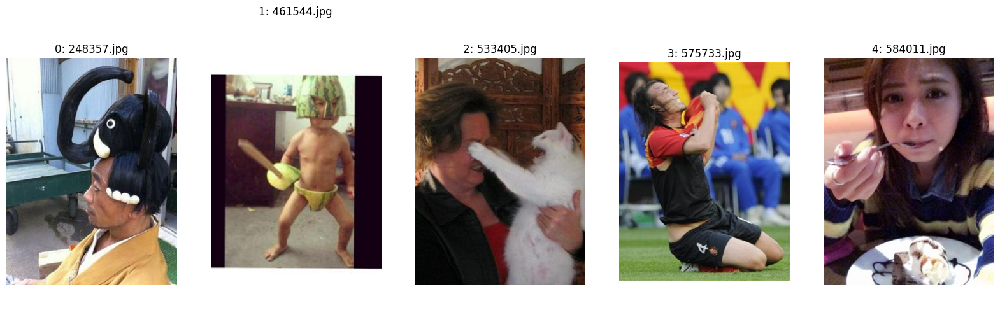

0: <BOS>この子の頭の中に何か？<EOS>な？<EOS>分かってる<EOS>分かんない？<EOS>りゃいいんだよ<EOS>っ！<EOS>は
1: <BOS>え？今日の試合明日？<EOS>中止なの？<EOS>の？<EOS>っぱいって？？<EOS>ーん？<EOS>の？<EOS>って
2: <BOS>この写真を撮った者は、、私が悪い事は思い出す。<EOS>の写真が、私の猫になりなさい
3: <BOS>この後、二人が一斉にボールを投げてしまう<EOS>分からない<EOS>のポーズ<EOS>の図<EOS>のポーズ<EOS><EOS>が決めた事
4: <BOS>食べられることなく、食べる<EOS>る。<EOS>ろ。<EOS>ろ？<EOS>、食べるん？<EOS>！<EOS>。<EOS>ろ。<EOS>ろ
Epoch 2/25


100%|██████████| 442/442 [00:17<00:00, 25.45it/s, loss=3.97, accuracy=0.324, perplexity=53.7]


Train Loss: 3.9084, Train Accuracy: 0.3228, Train Perplexity: 50.6357
Test Loss: 3.9655, Test Accuracy: 0.3242, Test Perplexity: 53.7163


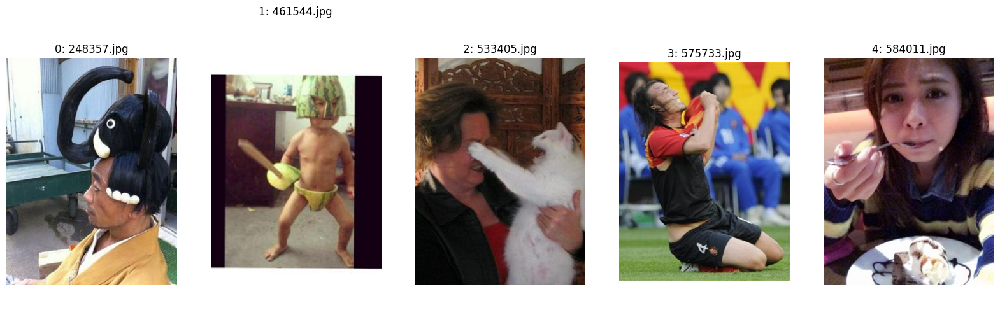

0: <BOS>お母さん、この子飼っていい？<EOS>って聞いたら<EOS>た<EOS>って<EOS>ました。<EOS>ましたね<EOS>ましたよ？<EOS>
1: <BOS>え？この状況で入ったの？<EOS>って入れる保険があるんですか！！<EOS>は、<EOS>って！<EOS>ませんでしたー
2: <BOS>お前が猫じゃらしを見た目の前で見てくる<EOS>の。<EOS>の彼女は外に出ろ。<EOS>っ！！<EOS>
3: <BOS>ちょっと！！ちょっとちょっと！<EOS>！！<EOS>っと！<EOS>っと待ってる！<EOS>ーー！<EOS>！<EOS>ー
4: <BOS>彼女の家に泊まれそう。<EOS>来たらこの店に入れ<EOS>る？<EOS>った。<EOS>は、お前に来る
Epoch 3/25


100%|██████████| 442/442 [00:16<00:00, 26.50it/s, loss=3.93, accuracy=0.33, perplexity=51.9] 


Train Loss: 3.7048, Train Accuracy: 0.3402, Train Perplexity: 41.2783
Test Loss: 3.9304, Test Accuracy: 0.3297, Test Perplexity: 51.9428


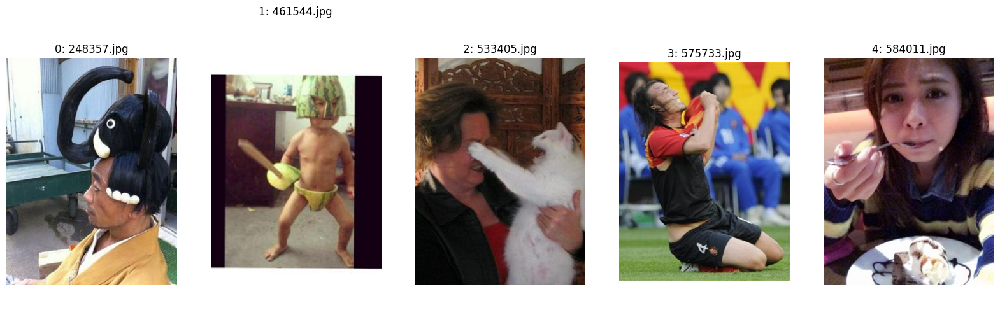

0: <BOS>この髪型にしてください。<EOS>血を垂れ流します<EOS>りませんか？<EOS>ませんよ<EOS>りますか？<EOS>ませんよ。。<EOS>
1: <BOS>お、俺が魔王を倒した勇者だ！！！勇者よ！<EOS>、魔王の姿を！<EOS>戦え！<EOS>戦う相手
2: <BOS>猫が寝込む寸前<EOS>猫<EOS>猫<EOS>猫<EOS>猫<EOS><EOS>猫<EOS>猫の手<EOS>の手<EOS><EOS>が届かない。<EOS>
3: <BOS>この後、彼は自分がボールを蹴りに落とされた。<EOS>悪い事をする<EOS>の時の時の彼女。<EOS>だ
4: <BOS>お父さんが、お母さんに見つかって、この子を探してる<EOS>の子は、私。<EOS>りました！<EOS>ました<EOS>ります
Epoch 4/25


100%|██████████| 442/442 [00:16<00:00, 26.54it/s, loss=3.93, accuracy=0.333, perplexity=51.7]


Train Loss: 3.5564, Train Accuracy: 0.3534, Train Perplexity: 35.5725
Test Loss: 3.9259, Test Accuracy: 0.3326, Test Perplexity: 51.6740


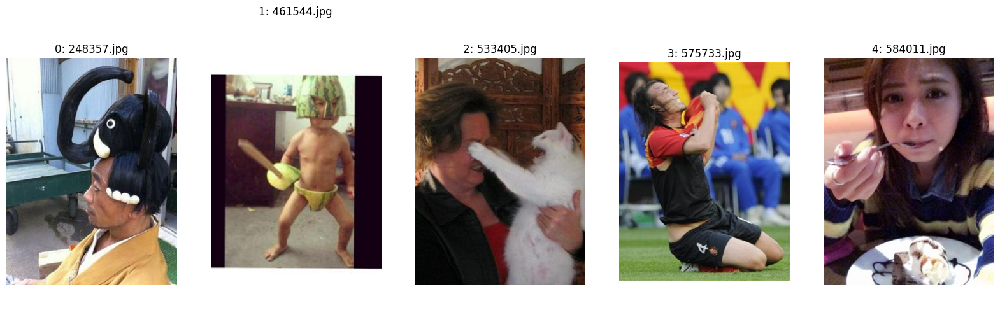

0: <BOS>頭の後ろ髪を引き締める<EOS>する<EOS>を間違えた<EOS>入る<EOS>の方を考え<EOS>な<EOS>に<EOS>策
1: <BOS>今、俺の中のリトルグレイトゥル、お前は逃げ出さない！<EOS>、、お前ら逃げろ！<EOS>
2: <BOS>猫背の治療<EOS>ます！<EOS>きます。<EOS>りますよー！<EOS>！<EOS>！<EOS>、お願いします！<EOS>って！<EOS>
3: <BOS>このポーズでボールが動かないんですよ。<EOS>んすか。<EOS>って、この匂い！<EOS>って・・・。<EOS>ん
4: <BOS>お分かりいただけただろうか？<EOS>、この世の全てを。<EOS>、、、。。<EOS>り、、<EOS>って、、
Epoch 5/25


100%|██████████| 442/442 [00:16<00:00, 26.39it/s, loss=3.94, accuracy=0.334, perplexity=52.8]


Train Loss: 3.4325, Train Accuracy: 0.3649, Train Perplexity: 31.4295
Test Loss: 3.9426, Test Accuracy: 0.3343, Test Perplexity: 52.7747


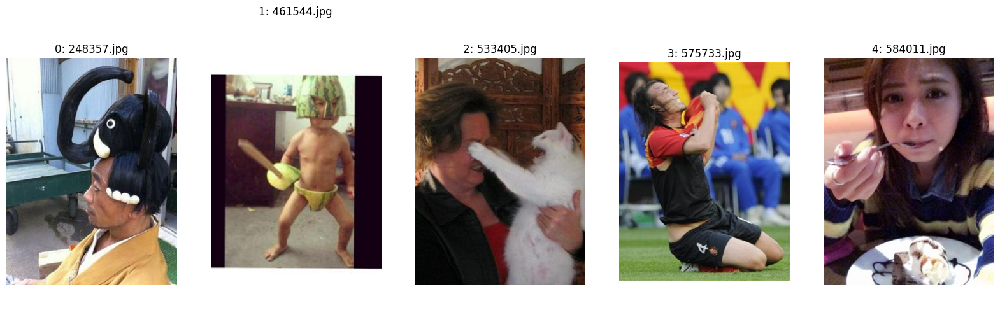

0: <BOS>ヘアジャムじゃない<EOS>ヘアーい<EOS><EOS>ヘアーって言ったらこんなんだ。<EOS>ってよ。<EOS><EOS>ねー。<EOS>。
1: <BOS>お腹が空いたら地球が見えなくなったんだ<EOS><EOS>。<EOS>、、、<EOS>っと。<EOS>、、<EOS>、。<EOS>っ
2: <BOS>猫をかぶる<EOS>猫。<EOS>る。<EOS>る。<EOS>。<EOS>る。<EOS>る。<EOS>。<EOS>。<EOS>。<EOS>を作る
3: <BOS>お、今日はカレーだな<EOS>にしよう！<EOS><EOS>っと<EOS>！<EOS>、、、<EOS>った！<EOS>って、<EOS>って
4: <BOS>お前の顔は食っていいのか！！<EOS>！<EOS>！？<EOS>は、、俺の後ろに！<EOS>！！！！！
Epoch 6/25


100%|██████████| 442/442 [00:16<00:00, 26.70it/s, loss=3.98, accuracy=0.333, perplexity=54.7]


Train Loss: 3.3225, Train Accuracy: 0.3757, Train Perplexity: 28.1574
Test Loss: 3.9797, Test Accuracy: 0.3329, Test Perplexity: 54.7387


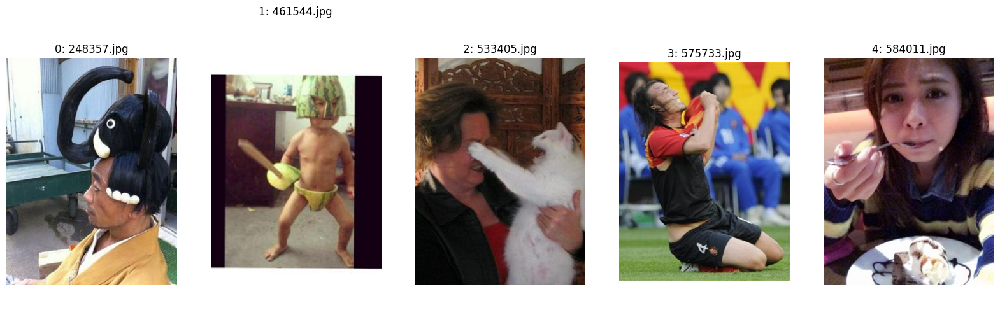

0: <BOS>昨日助けたカラスの巣の横で何かが投げ返ってきた<EOS>した。<EOS>鳥<EOS>んな鳥のフンを投げです
1: <BOS>お前、これ着てるやつやん？<EOS>れ着れ着いてからお前が最初のステージのボスや<EOS>カイの奴が来
2: <BOS>猫に耳を傾けた猫の顔がツボった。<EOS>ん？<EOS>んここ！？<EOS>ーんな感じでよ！
3: <BOS>おーい！こっちこっち！<EOS>ハンド！<EOS>ハンド！！<EOS>ちゃダメだって！<EOS>ちゃダメだって！<EOS>げちゃうやん！<EOS>ちゃ
4: <BOS>この後、スタッフが美味しく頂かれました<EOS>スタッフは、この写真である。<EOS>お客様であった。<EOS>お見せしよう
Epoch 7/25


100%|██████████| 442/442 [00:16<00:00, 26.21it/s, loss=4.01, accuracy=0.333, perplexity=56.6]


Train Loss: 3.2221, Train Accuracy: 0.3861, Train Perplexity: 25.4665
Test Loss: 4.0128, Test Accuracy: 0.3326, Test Perplexity: 56.6471


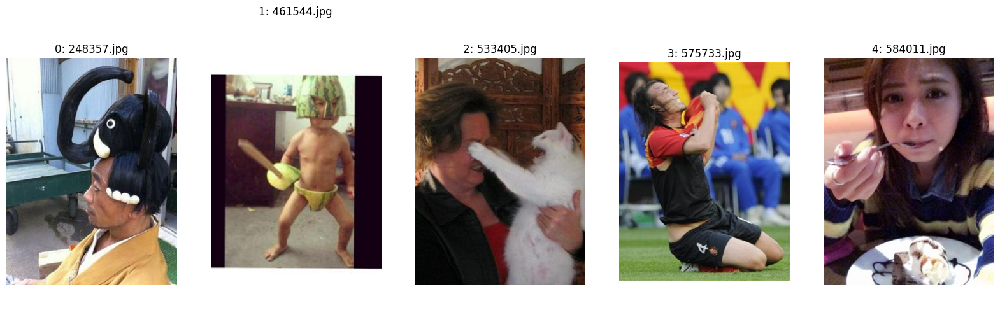

0: <BOS>この髪型にして、流行ってるって言ったら怒られた<EOS>な髪型になった。<EOS>な美容師と遊び<EOS>泣き出しが
1: <BOS>この後、鉄砲で殴られた<EOS>痛みを思い出した。<EOS>のみんなが、この体勢になると思い出す。<EOS>のみ
2: <BOS>お前は猫を追いかけてるぞ！<EOS>犬！<EOS>犬！猫じゃらしを追って来る！！<EOS>！<EOS>！
3: <BOS>このポーズで敵が襲ってきた<EOS>の敵は何かが弾き飛ばされる。<EOS>、その後、彼は、実は私
4: <BOS>口で溶けるタイプのスプーン<EOS><EOS>用に、全部いただけます。<EOS>用を足す。。<EOS>、、、、。<EOS>
Epoch 8/25


100%|██████████| 442/442 [00:16<00:00, 27.31it/s, loss=4.07, accuracy=0.331, perplexity=59.7]


Train Loss: 3.1300, Train Accuracy: 0.3961, Train Perplexity: 23.2256
Test Loss: 4.0666, Test Accuracy: 0.3313, Test Perplexity: 59.6836


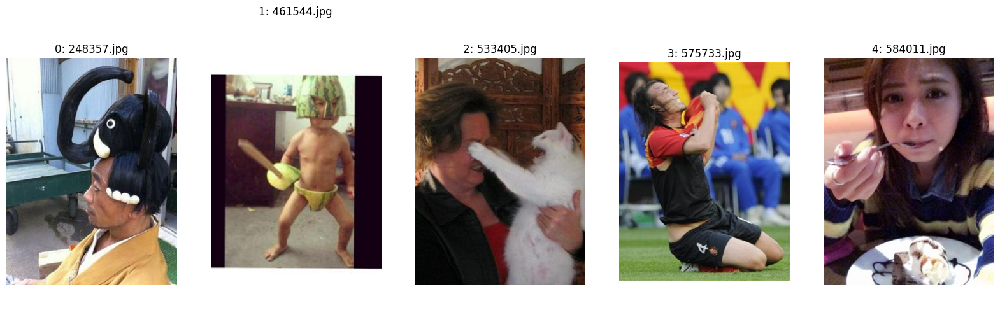

0: <BOS>昨日の夜は、この後の頭が取れた。<EOS>、彼は気づいたら頭の上に・・・<EOS>ましたね<EOS>
1: <BOS>俺のプリン食べられた！<EOS>初日の出て来る！！<EOS>！<EOS>っ！<EOS>、出直す！<EOS>！<EOS>る
2: <BOS>俺の子じゃないって！！！<EOS>！<EOS>ッ！<EOS>！<EOS>！<EOS>！<EOS>！！！<EOS>！！！<EOS>！！<EOS>
3: <BOS>もう、ゴール決めた！<EOS>、、、、、<EOS>、、、、、<EOS>、！！<EOS>、、<EOS>！<EOS>、、、
4: <BOS>こんなんで、あたしの食事中に入って！<EOS>ますから！<EOS>ます？<EOS>、あたしの中に入れてください！<EOS>
Epoch 9/25


100%|██████████| 442/442 [00:18<00:00, 23.63it/s, loss=4.12, accuracy=0.33, perplexity=63.3] 


Train Loss: 3.0451, Train Accuracy: 0.4057, Train Perplexity: 21.3398
Test Loss: 4.1200, Test Accuracy: 0.3299, Test Perplexity: 63.2890


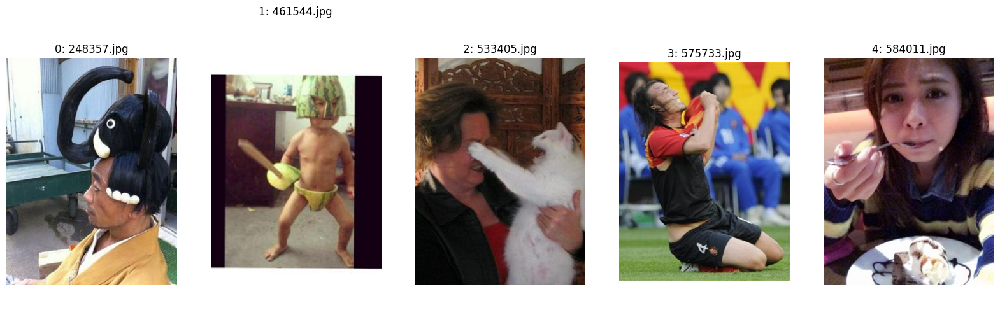

0: <BOS>この後、脳天直撃。<EOS>他界<EOS>する<EOS>、脳を犯した。<EOS>脳は自分で見届けよう。<EOS>、、、
1: <BOS>今、お父さんがお前の家、玄関で待ってたんだがなー<EOS>なー<EOS>悪い<EOS>なー<EOS>犬が来
2: <BOS>猫の手も借りたくなる<EOS>手<EOS>！<EOS>っ！<EOS>ー！<EOS>る？猫の手貸して！借りたて言っ
3: <BOS>この後、彼の手を握った者はいなかった<EOS><EOS><EOS>。<EOS>。<EOS>ない。<EOS>ない事に気づいた。<EOS>ない
4: <BOS>食べたいのに太らない体質なんですが良かったです。<EOS>出してください。<EOS>りましたよ。<EOS>です。<EOS>ってどういうことじゃ。<EOS>
Epoch 10/25


100%|██████████| 442/442 [00:16<00:00, 27.17it/s, loss=4.18, accuracy=0.326, perplexity=67.3]


Train Loss: 2.9661, Train Accuracy: 0.4153, Train Perplexity: 19.7256
Test Loss: 4.1822, Test Accuracy: 0.3260, Test Perplexity: 67.3387


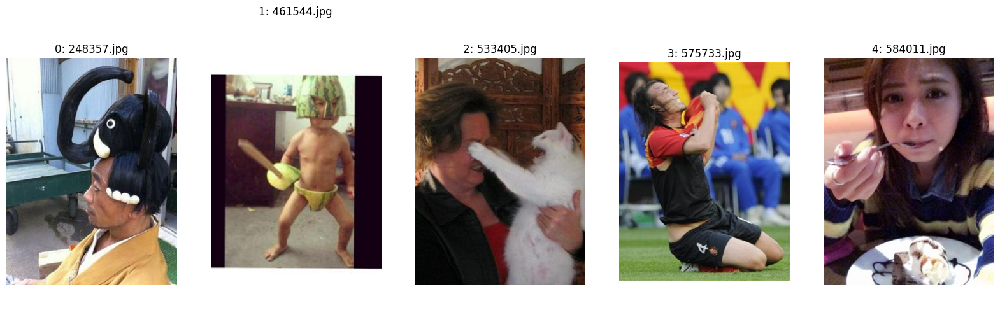

0: <BOS>あー、こりゃまた髪切った・・・<EOS>かつお節の部分に粘土だ<EOS>かつお節は<EOS>かつだぜ。
1: <BOS>俺が伝説の刑事だ<EOS>っ！<EOS>って言ってたじゃない！<EOS>だ！！<EOS>ずつ俺に気を付けろ！
2: <BOS>はい、猫飼いたい。<EOS>ー！<EOS>ーー！<EOS>ー！ペット買いー！？<EOS>ーー！今日買いー！
3: <BOS>試合の途中で猛烈にオナラをする方法が無かった<EOS>ショッピング<EOS><EOS>のまま他界<EOS>。<EOS>伸ばしてる<EOS>腕立ちの
4: <BOS>口からスプーンを出す手品で食べ物を練習<EOS>です。<EOS>目が変わります。<EOS>ません。<EOS>ません。
Epoch 11/25


100%|██████████| 442/442 [00:19<00:00, 23.00it/s, loss=4.24, accuracy=0.325, perplexity=71.3]


Train Loss: 2.8932, Train Accuracy: 0.4242, Train Perplexity: 18.3410
Test Loss: 4.2375, Test Accuracy: 0.3247, Test Perplexity: 71.3485


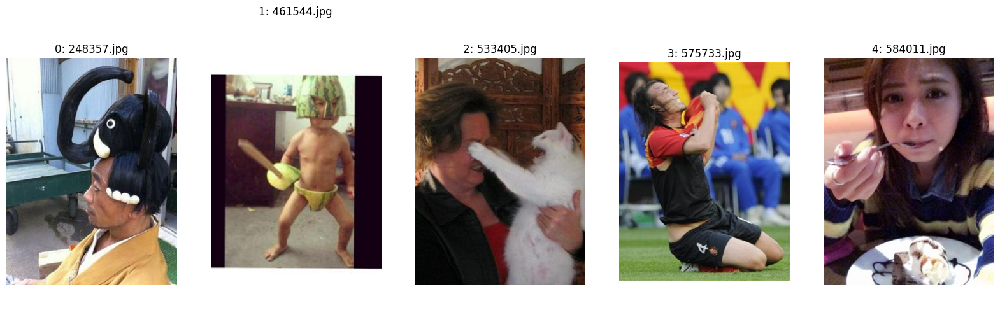

0: <BOS>頭に刺さった剣を抜いてもらった後、振り向いたら頭から血が出て来た。<EOS>テープで判断さん。<EOS>
1: <BOS>初めてのおつかい<EOS>場所に来たが、忘れた<EOS>不安が隠れ<EOS>果てしない。<EOS>。<EOS><EOS>。<EOS>。<EOS>な
2: <BOS>お前の母ちゃんデベソー！！<EOS>っと猫かぶってんじゃねぇ！<EOS>、俺の！<EOS>ってしい！！<EOS>、
3: <BOS>この試合の最中に選手の名前を叫んだらいきなり呼ばれた<EOS>鍛えてきた。<EOS>ピッチピチ。<EOS>な。<EOS>な
4: <BOS>お前んち、ここ食べると思ってんの？<EOS>ないね。<EOS>、これ全部同じこと言えるの？<EOS>だ、わかってるよ。
Epoch 12/25


100%|██████████| 442/442 [00:19<00:00, 22.96it/s, loss=4.29, accuracy=0.323, perplexity=75.3]


Train Loss: 2.8255, Train Accuracy: 0.4331, Train Perplexity: 17.1422
Test Loss: 4.2894, Test Accuracy: 0.3226, Test Perplexity: 75.2713


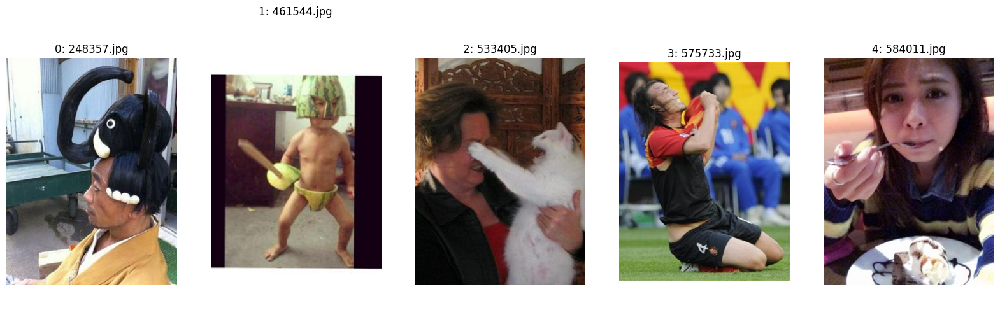

0: <BOS>自分の頭で充電切れた<EOS>湯が出た<EOS><EOS>勝ち<EOS>造られた<EOS>汁<EOS>毛<EOS>毛<EOS>な類。<EOS>汁
1: <BOS>俺のプリン食ったのお前だろ！<EOS>け出てこい！<EOS>ュース！！<EOS>ュース！<EOS>ュース
2: <BOS>抱っこー！<EOS>ーぜ！<EOS>ー！<EOS>ーサッ！<EOS>ーーサッサッ！<EOS>ーんと！<EOS>！<EOS>っ
3: <BOS>ゴール決めたのに誰も入らない<EOS>ーらない<EOS>！！！<EOS>なー！<EOS>なーい！<EOS>なー！<EOS>なー
4: <BOS>この後、口の中から空気を出してくる。<EOS>谷間を見上げると、口から出てきました。<EOS>。<EOS>ります。
Epoch 13/25


100%|██████████| 442/442 [00:18<00:00, 23.77it/s, loss=4.36, accuracy=0.32, perplexity=80.4] 


Train Loss: 2.7628, Train Accuracy: 0.4416, Train Perplexity: 16.1005
Test Loss: 4.3557, Test Accuracy: 0.3198, Test Perplexity: 80.4397


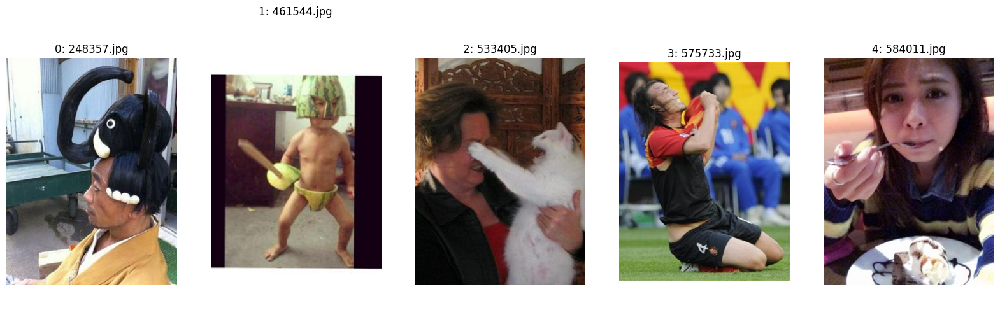

0: <BOS>自分の髪の量が、彼は首を長くしている。<EOS>苦しむため、シャンプーに変えたんだ。<EOS>。<EOS>
1: <BOS>今から合コン行くから待っててててー！<EOS>豚！<EOS>豚作りに行こう！<EOS>豚！<EOS>豚！<EOS>
2: <BOS>お前の母ちゃんでーべーそー<EOS>ー！！<EOS>ー！！！<EOS>ー！！<EOS>ーー！！！！
3: <BOS>おーっと！ここで手首を繋げるんだ！<EOS>からずっと、臭い屁を嗅いでる。<EOS>臭くなる気絶
4: <BOS>口からピンポン玉を出す仕事<EOS>り<EOS>兄<EOS>兄<EOS>兄の兄<EOS>兄。<EOS>兄。<EOS>様子がおかしい。<EOS>
Epoch 14/25


100%|██████████| 442/442 [00:23<00:00, 18.61it/s, loss=4.41, accuracy=0.318, perplexity=85.3]


Train Loss: 2.7035, Train Accuracy: 0.4496, Train Perplexity: 15.1728
Test Loss: 4.4121, Test Accuracy: 0.3178, Test Perplexity: 85.3026


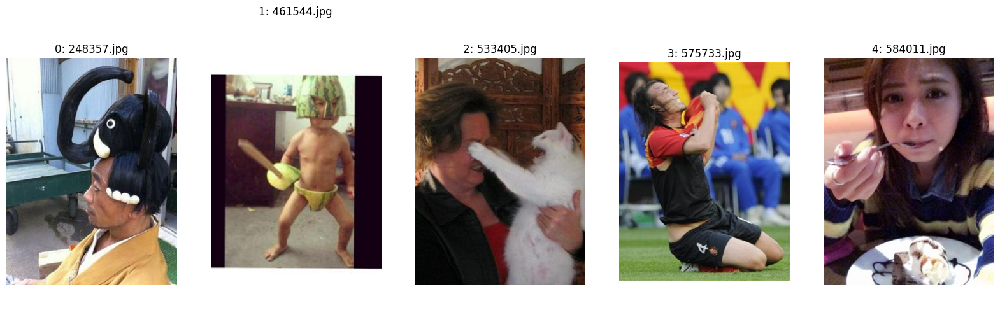

0: <BOS>お前の髪型にしてやんよ<EOS>！<EOS>キーやんよ！！<EOS>からずっと遊んどるって！<EOS>。<EOS>からず。<EOS>
1: <BOS>ふふふふ、ふふふふふふふふふふ。これが私の兄ちゃんなにもらった最愛してるって本当にやりな
2: <BOS>お前、猫だましのためにきますかっ！<EOS>用はない！<EOS>用のハトを足しに来たんじゃい！<EOS>りゃいいって言っ
3: <BOS>この格好で試合に勝ったらゴール決める<EOS>一位を決める<EOS>に<EOS>を聞く手前でゴールキーパー<EOS>やす<EOS>わり
4: <BOS>食べる前の一口<EOS>ちいちパイを吸ってくる。<EOS>って。<EOS>ちいち驚く。<EOS>ってる。<EOS>っている。<EOS>
Epoch 15/25


100%|██████████| 442/442 [00:19<00:00, 23.10it/s, loss=4.46, accuracy=0.317, perplexity=90.1]


Train Loss: 2.6491, Train Accuracy: 0.4572, Train Perplexity: 14.3692
Test Loss: 4.4624, Test Accuracy: 0.3169, Test Perplexity: 90.0569


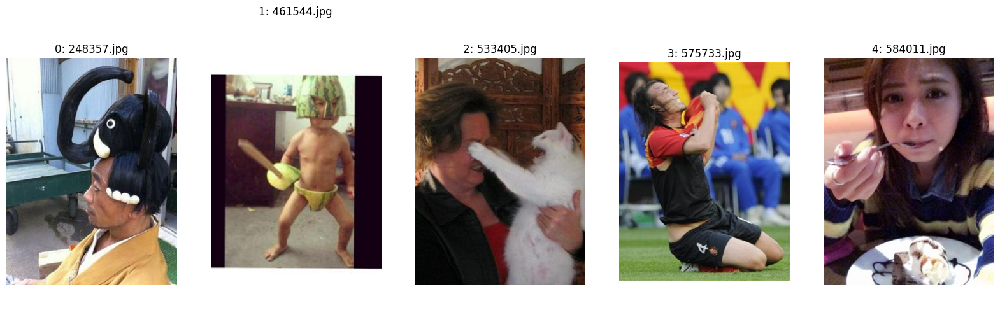

0: <BOS>お前髪の毛は切らないでって言ったやないかい？<EOS>にして？<EOS>っ？<EOS>？<EOS>たっぷりだろ。<EOS>たっぷりか
1: <BOS>俺の鉄板を買ってくれない女<EOS>な？<EOS>りゃ、星買い物の山から行ってやるからな。<EOS>りゃあ。<EOS>
2: <BOS>猫背って、直っ！！<EOS>ーい！<EOS>っ！<EOS>ぁっ！<EOS>ーんって！！<EOS>っ！！
3: <BOS>背中を見せると、とても動く。<EOS>しい。。<EOS>しい。<EOS>な屁は。<EOS>である。<EOS>である。<EOS>である。<EOS>
4: <BOS>この状態から、入れる保険があるんですか？<EOS>？<EOS>？<EOS>？<EOS>口からだますか？<EOS>っ。<EOS>っていくの顔に
Epoch 16/25


 67%|██████▋   | 28480/42624 [28:52<16:47, 14.04it/s, loss=2.53, accuracy=0.474, perplexity=12.8]  

In [ ]:
generator = SentenceGenerator(len(tokenizer.get_vocab()), MAX_SENTENCE_LENGTH + 1, HIDDEN_DIM, 768)

START_EPOCH = 0
train_loss_history = list()
test_loss_history = list()
train_acc_history = list()
test_acc_history = list()
train_perplexity_history = list()
test_perplexity_history = list()

# 学習履歴がある場合，途中から再開する
if os.path.exists(f"{result_dir}train_history.json"):
    with open(f"{result_dir}train_history.json", "r") as f:
        history = json.load(f)
        train_loss_history = history["train_loss_history"]
        test_loss_history = history["test_loss_history"]
        train_acc_history = history["train_acc_history"]
        test_acc_history = history["test_acc_history"]
    
    START_EPOCH = len(train_loss_history)
    generator.load_state_dict(torch.load(f"{result_dir}generator_{START_EPOCH}.pth"))

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = generator.to(device)
optimizer = optim.Adam(generator.parameters(), lr = LERNING_RATE)

def calculate_accuracy(outputs, teacher_signals):
    _, predicted = torch.max(outputs, dim=-1)
    mask = teacher_signals != 0
    
    correct = (predicted == teacher_signals) & mask 
    correct = correct.sum().item()
    
    total = mask.sum().item()
    accuracy = correct / total if total > 0 else 0
    return accuracy

def calculate_perplexity(loss):
    return torch.exp(loss)

def train_step(generator, optimizer, inputs_1, inputs_2, teacher_signals):
    generator.train()
    optimizer.zero_grad()

    inputs_1 = inputs_1.to(device)
    inputs_2 = inputs_2.to(device)
    teacher_signals = teacher_signals.to(device)

    outputs = generator(inputs_2, inputs_1)
    
    outputs = outputs.view(-1, outputs.size(-1))  # [32*32, 8192]
    teacher_signals = teacher_signals.view(-1)    # [32*32]

    loss = F.cross_entropy(outputs, teacher_signals, 
                           ignore_index = 0)
    loss.backward()
    optimizer.step()

    accuracy = calculate_accuracy(outputs, teacher_signals)
    perplexity = calculate_perplexity(loss)

    return loss.item(), accuracy, perplexity.item()

def test_step(generator, inputs_1, inputs_2, teacher_signals):
    generator.eval()

    inputs_1 = inputs_1.to(device)
    inputs_2 = inputs_2.to(device)
    teacher_signals = teacher_signals.to(device)

    with torch.no_grad():
        outputs = generator(inputs_2, inputs_1)

        outputs = outputs.view(-1, outputs.size(-1))  # [32*32, 8192]
        teacher_signals = teacher_signals.view(-1)    # [32*32]

        loss = F.cross_entropy(outputs, teacher_signals, 
                               ignore_index = 0)
        accuracy = calculate_accuracy(outputs, teacher_signals)
        perplexity = calculate_perplexity(loss)

    return loss.item(), accuracy, perplexity.item()

for epoch in range(START_EPOCH, EPOCHS):
    print(f"Epoch {epoch + 1}/{EPOCHS}")

    # train
    train_loss = 0
    train_accuracy = 0
    train_perplexity = 0
    total_samples = 0
    pb = tqdm(train_dataloader)
    for inputs_1, inputs_2, teacher_signals in pb:
        batch_size = inputs_1.size(0)

        loss, accuracy, perplexity = train_step(generator, optimizer, inputs_1, inputs_2, teacher_signals)

        train_loss += loss * batch_size
        train_accuracy += accuracy * batch_size
        train_perplexity += perplexity * batch_size
        total_samples += batch_size

        pb.set_postfix({"loss": train_loss / total_samples, "accuracy": train_accuracy / total_samples, "perplexity": train_perplexity / total_samples})
    train_loss /= total_samples
    train_accuracy /= total_samples
    train_perplexity /= total_samples

    # test
    test_loss = 0
    test_accuracy = 0
    test_perplexity = 0
    total_samples = 0
    pb = tqdm(test_dataloader)
    for inputs_1, inputs_2, teacher_signals in pb:
        batch_size = inputs_1.size(0)

        loss, accuracy, perplexity = test_step(generator, inputs_1, inputs_2, teacher_signals)

        test_loss += loss * batch_size
        test_accuracy += accuracy * batch_size
        test_perplexity += perplexity * batch_size
        total_samples += batch_size

        pb.set_postfix({"loss": test_loss / total_samples, "accuracy": test_accuracy / total_samples, "perplexity": test_perplexity / total_samples})
    test_loss /= total_samples
    test_accuracy /= total_samples
    test_perplexity /= total_samples

    print(f"Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}, Train Perplexity: {train_perplexity:.4f}")
    print(f"Test Loss: {test_loss:.4f}, Test Accuracy: {test_accuracy:.4f}, Test Perplexity: {test_perplexity:.4f}")

    train_loss_history.append(train_loss)
    test_loss_history.append(test_loss)
    train_acc_history.append(train_accuracy)
    test_acc_history.append(test_accuracy)
    train_perplexity_history.append(train_perplexity)
    test_perplexity_history.append(test_perplexity)
    with open(f"{result_dir}train_history.json", "w") as f:
        json.dump({
            "train_loss_history": train_loss_history,
            "test_loss_history": test_loss_history,
            "train_acc_history": train_acc_history,
            "test_acc_history": test_acc_history,
            "train_perplexity_history": train_perplexity_history,
            "test_perplexity_history": test_perplexity_history
        }, f)
    
    torch.save(generator.state_dict(), f"{result_dir}generator_{epoch + 1}.pth")
    if os.path.exists(f"{result_dir}generator_{epoch}.pth"):
        os.remove(f"{result_dir}generator_{epoch}.pth")
    
    if min(train_loss_history) == train_loss:
        torch.save(generator.state_dict(), f"{result_dir}generator_best.pth")
        if os.path.exists(f"{result_dir}generator_best_{epoch}.pth"):
            os.remove(f"{result_dir}generator_best_{epoch}.pth")

    test_image_paths = list(set([f"{IMAGE_DIR}{IN}.jpg" for IN in test_inputs_1]))
    generate_ohgiri(vit, image_feature_extractor, generator, test_image_paths[:5], tokenizer)
    print("=" * 50)

# 学習結果を描画
fig = plt.figure(figsize = (5, 5))
ax = fig.add_subplot(1, 1, 1)
ax.plot(train_loss_history, label = "train")
ax.plot(test_loss_history, label = "test")
ax.set_xlabel("epoch")
ax.set_ylabel("loss")
ax.legend()
ax.grid()

fig.savefig(f"{result_dir}train_history.png")

In [ ]:
from transformers import PreTrainedModel, PretrainedConfig

class GUMI_T_Config(PretrainedConfig):
    def __init__(self, vocab_size, input_length, hidden_dim, patch_dim, **kwargs):
        super().__init__(**kwargs)
        self.vocab_size = vocab_size
        self.input_length = input_length
        self.hidden_dim = hidden_dim
        self.patch_dim = patch_dim

class GUMI_T(PreTrainedModel):
    def __init__(self, config):
        super(GUMI_T, self).__init__(config)

        self.input_length = config.input_length

        self.vit = ViTModel.from_pretrained("google/vit-base-patch16-224-in21k")
        self.image_feature_extractor = ViTFeatureExtractor.from_pretrained("google/vit-base-patch16-224-in21k")

        self.generator = SentenceGenerator(
            config.vocab_size, 
            config.input_length, 
            config.hidden_dim, 
            config.patch_dim
        )

    def forward(self, input_ids, image_features):
        """
            input_ids: 単語のIDのリスト(batch_size, input_length)
            image_features: 画像の特徴量のリスト(batch_size, 196, 768)
        """
        
        outputs = self.generator(input_ids, image_features, )
        
        return outputs # [batch_size, input_length, vocab_size]

    def generate(self, inputs):
        pil_images = inputs["pixel_values"]

        images = self.image_feature_extractor(pil_images, return_tensors = "pt")
        image_features = self.vit(**images).last_hidden_state[:, 1:, :]

        gen_texts = torch.ones(size = (len(pil_images), 1)).to(torch.int32)

        for i in range(1, self.input_length):
            tmp_texts = F.pad(gen_texts, (0, self.input_length - i), value = 0).to(torch.int32)
            outputs = self.forward(tmp_texts, image_features)

            logits = outputs[:, i, :]
            probs = F.softmax(logits, dim = -1)

            top_k_probs, top_k_indices = torch.topk(probs, k = 5, dim = -1)
            top_k_probs = top_k_probs / top_k_probs.sum(dim = -1, keepdim = True) 
            chosen_indices = torch.multinomial(top_k_probs, 1).squeeze(-1)
            gathered_indices = top_k_indices.gather(-1, chosen_indices.unsqueeze(-1))

            gen_texts = torch.cat([gen_texts, gathered_indices], dim = 1)